<a href="https://colab.research.google.com/github/inyong37/Study/blob/master/IV.%20COLAB/ENEMY/Enemy_5_DL_YOLO_Object_Detection_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# -*- coding: utf-8 -*-
# Date: 2020-11-26-Thu.
# Author: Inoyng Hwang (inyong1020@gmail.com)

# Setup Tool-Option-Site, Editor
# Setup Runtime-Runtime Type Change

# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls '/content/drive/My Drive/PUBLIC/PROJECT/ENEMY'

haarcascade_fullbody.xml  pedestrian_03.jpg  pedestrian_06.jpg
pedestrian_01.jpg	  pedestrian_04.jpg  pedestrian_07.jpg
pedestrian_02.jpg	  pedestrian_05.jpg  starry_night.jpg


dog


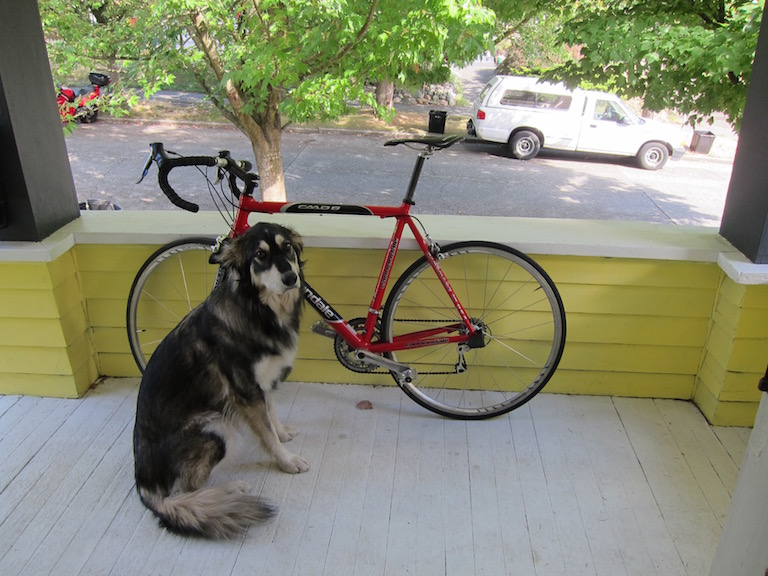

eagle


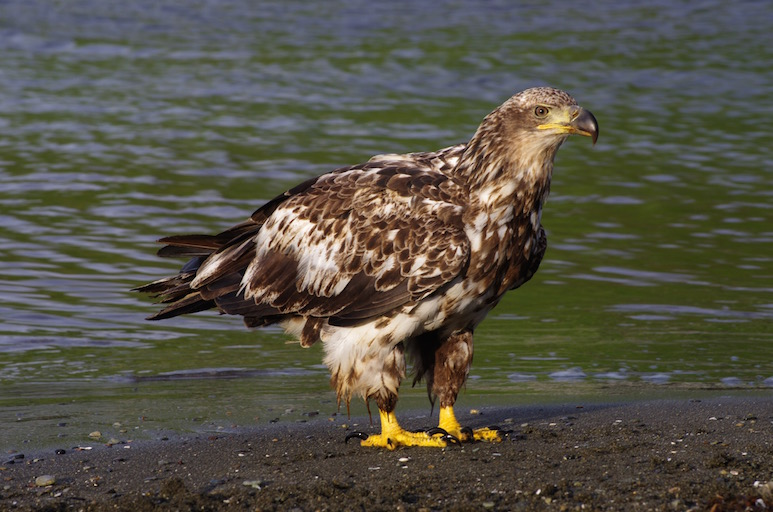

giraffe


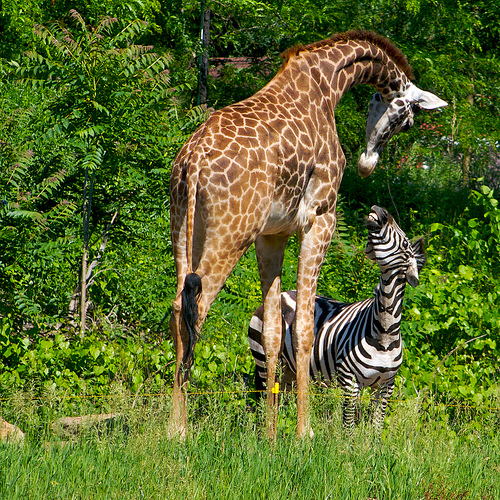

horses


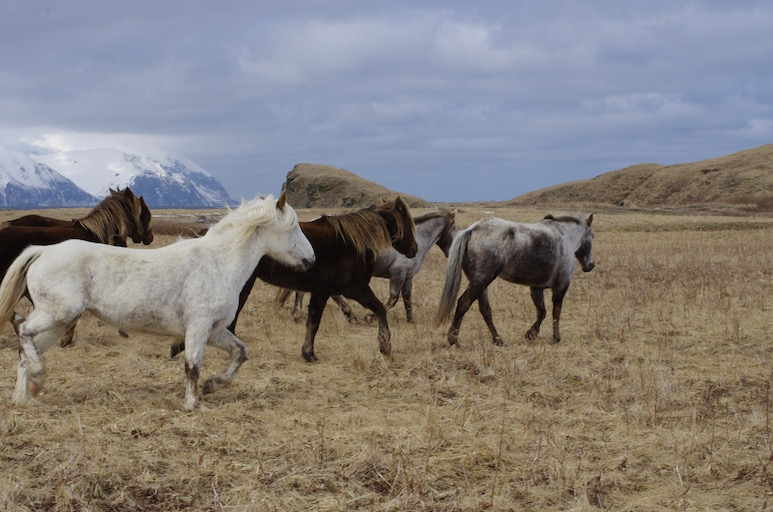

kite


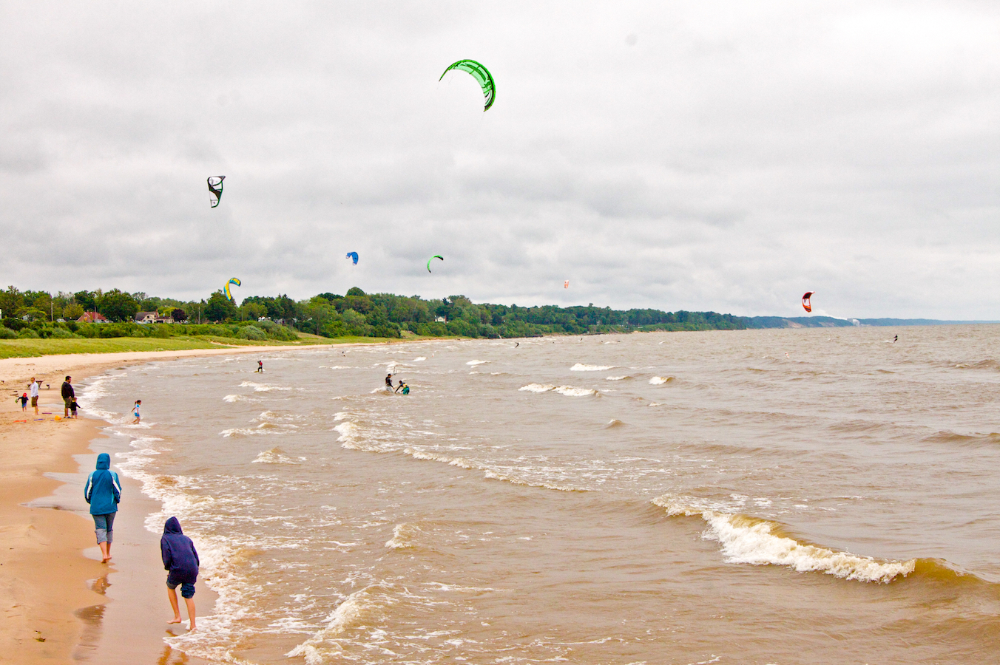

person


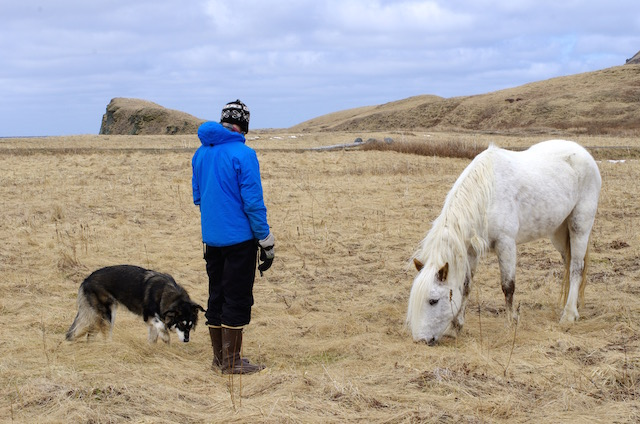

scream


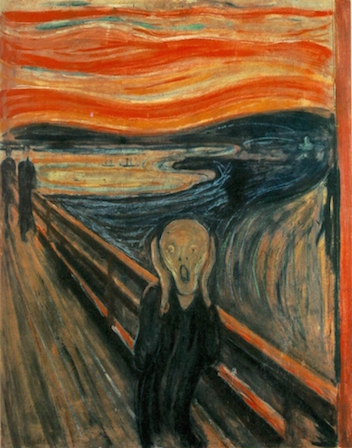

In [ ]:
# YOLO Object Detection
# https://www.pyimagesearch.com/2018/11/12/yolo-object-detection-with-opencv/

import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

yolo_directory = '/content/drive/My Drive/PUBLIC/PROJECT/ENEMY/YOLO/'
image_directory = yolo_directory + 'Images/'
labels_file_name = 'coco.names'
labels_file_path = yolo_directory + labels_file_name
weights_file_name = 'yolov3.weights'
weights_file_path = yolo_directory + weights_file_name
config_file_name = 'yolov3.cfg'
config_file_path = yolo_directory + config_file_name

np.random.seed(37)
labels = open(labels_file_path).read().strip().split('\n')
colors = np.random.randint(0, 255, size=(len(labels), 3), dtype='uint8')
network = cv.dnn.readNetFromDarknet(config_file_path, weights_file_path)

images_name = ['dog',
               'eagle',
               'giraffe',
               'horses',
               'kite',
               'person',
               'scream']
images = []
for name in images_name:
  image_path = image_directory + name + '.jpg'
  image = cv.imread(image_path)
  print(name)
  cv2_imshow(image)
  images.append([image, name])

dog


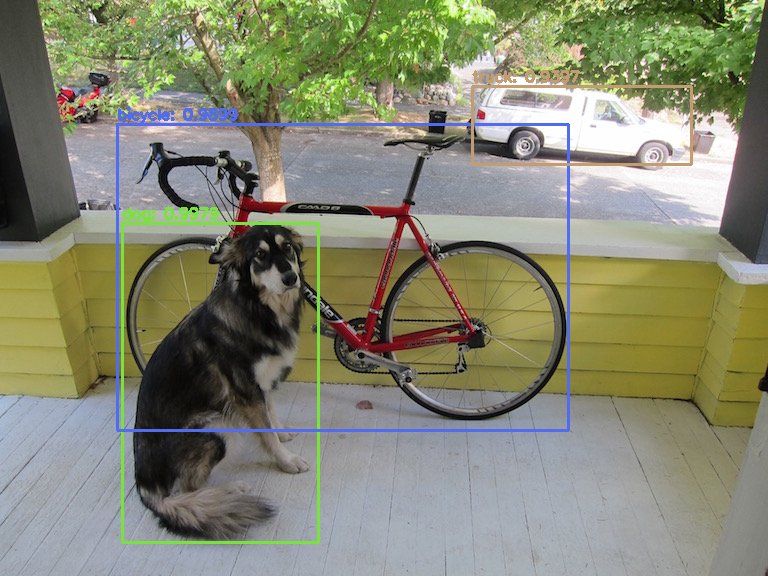

eagle


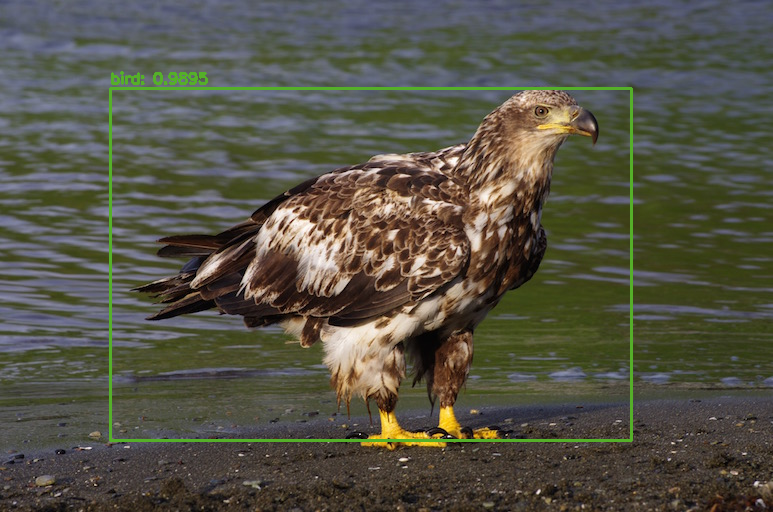

giraffe


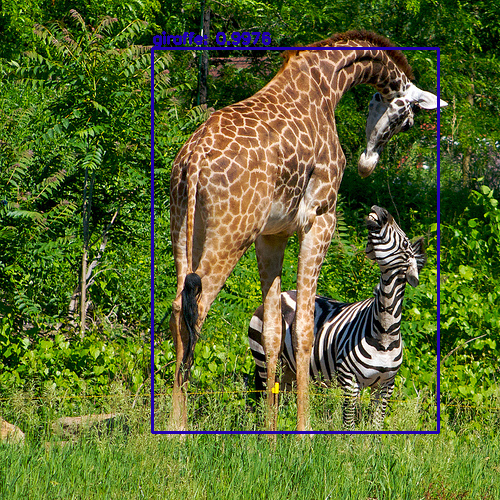

horses


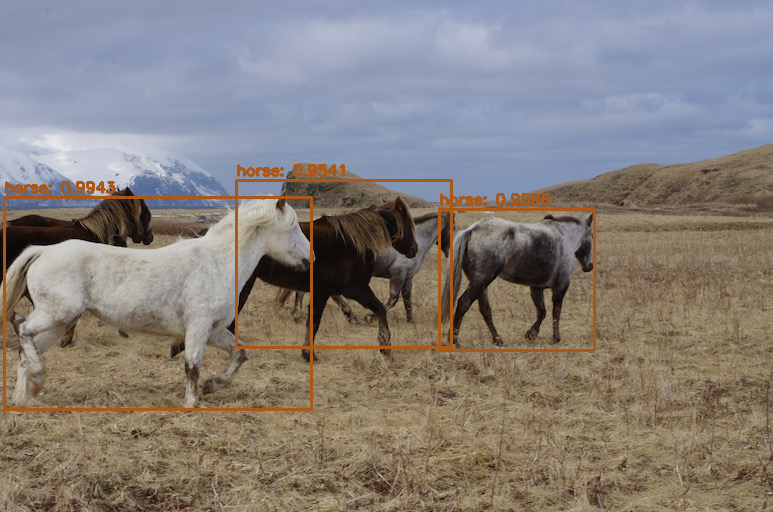

kite


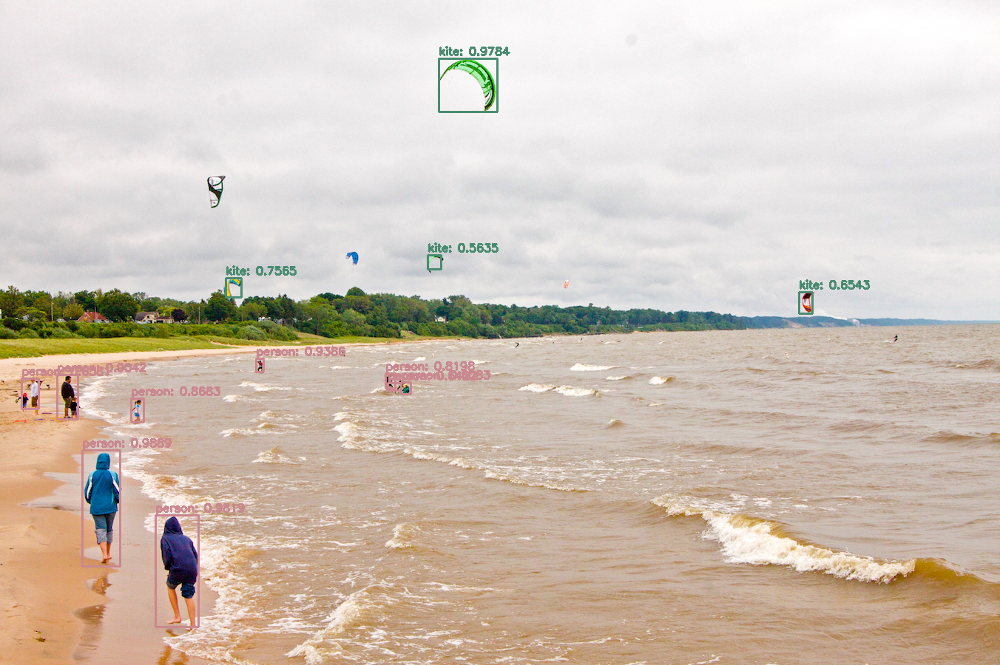

person


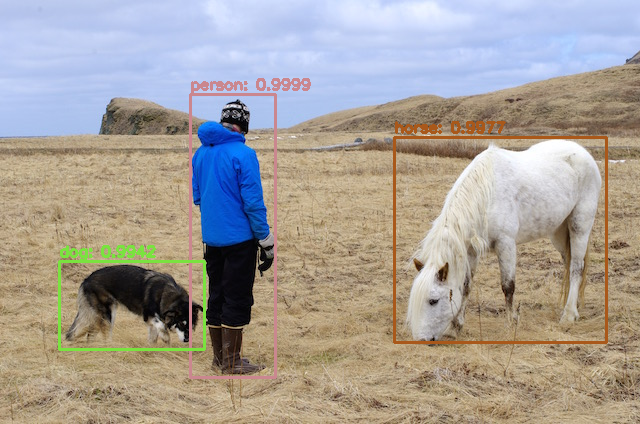

scream


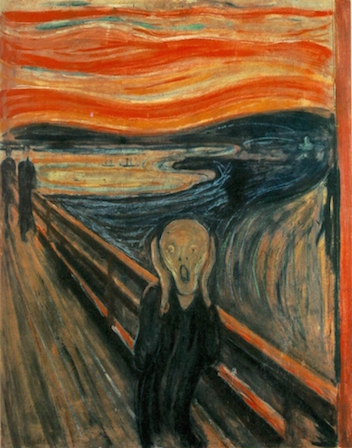

In [ ]:
for image, name in images:
  (H, W) = image.shape[:2]

  layer_names = network.getLayerNames()
  layer_names = [layer_names[i[0] - 1] for i in network.getUnconnectedOutLayers()]

  blob = cv.dnn.blobFromImage(image, 1 / 255.0, (416, 416), swapRB=True, crop=False)
  network.setInput(blob)
  layerOutputs = network.forward(layer_names)

  boxes = []
  confidences = []
  classIDs = []

  for output in layerOutputs:
    for detection in output:
      scores = detection[5:]
      classID = np.argmax(scores)
      confidence = scores[classID]

      if confidence > 0.5:
        box = detection[0:4] * np.array([W, H, W, H])
        (x, y, width, height) = box.astype("int")

        x = int(x - (width / 2))
        y = int(y - (height / 2))

        boxes.append([x, y, int(width), int(height)])
        confidences.append((float(confidence)))
        classIDs.append(classID)

  indexes = cv.dnn.NMSBoxes(boxes, confidences, 0.5, 0.3)

  if len(indexes) > 0:
    for i in indexes.flatten():
      (x, y) = (boxes[i][0], boxes[i][1])
      (w, h) = (boxes[i][2], boxes[i][3])

      color = [int(c) for c in colors[classIDs[i]]]
      cv.rectangle(image, (x, y, w, h), color, 2)
      text = "{}: {:.4f}".format(labels[classIDs[i]], confidences[i])
      cv.putText(image, text, (x, y-5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
  
  print(name)
  cv2_imshow(image)